# Imports

In [ ]:
!pip install transformers

In [ ]:
# Libraries for data handling and analysis
import pandas as pd
import numpy as np

# Tools for working with file and network
import glob
import os
import requests

# Data visualization tools
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Text cleaning tools
import spacy

# Handling collections of data
from collections import Counter

# Machine learning tools
import tensorflow as tf
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from transformers import TFBertModel, BertTokenizer

# Miscellaneous tools
import pickle
from google.colab import files

# Defining Variables

In [ ]:
# Load the spaCy language model
nlp = spacy.load("en_core_web_sm")

# Define the path to the GoEmotions dataset
data_directory = 'data/full_dataset'

# Loading Data

In [ ]:
# Ensure the directory exists, if not, create it
os.makedirs(data_directory, exist_ok=True)

# List of URLs to download GoEmotions data files
urls = [
    "https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_1.csv",
    "https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_2.csv",
    "https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_3.csv"
]

# Iterate over each URL
for url in urls:
    # Send a GET request to the URL
    r = requests.get(url)
    # If the GET request is unsuccessful, it will raise an HTTPError
    r.raise_for_status()

    # Extract filename from URL for saving locally
    filename = url.split("/")[-1]

    # Create a full file path
    file_path = os.path.join(data_directory, filename)

    # Open the file in binary write mode
    with open(file_path, 'wb') as f:
        # Write the content to file
        f.write(r.content)

# Initialize an empty list to store individual dataframes
emotions_data = []

# Get a list of all CSV files in the GoEmotions data directory
all_files = glob.glob(os.path.join(data_directory, "*.csv"))

# Read each file into a pandas DataFrame and append it to the list
for file in all_files:
    df = pd.read_csv(file, index_col=None, header=0)
    emotions_data.append(df)

# Print the list of files processed
print('Files processed:')
for file in all_files:
    print(f'  - {file}')
print()

# Concatenate all the individual dataframes into one
emotions_data = pd.concat(emotions_data, ignore_index=True)

# Print dataset information
print(f'The consolidated dataset has {len(emotions_data)} rows.\n')
print('Preview of the dataset:')
emotions_data.head()

Files processed:
  - data/full_dataset/goemotions_3.csv
  - data/full_dataset/goemotions_2.csv
  - data/full_dataset/goemotions_1.csv

The consolidated dataset has 211225 rows.

Preview of the dataset:


,text,id,author,subreddit,link_id,parent_id,created_utc,rater_id,example_very_unclear,admiration,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,Worst ending ever! I won't spoil it but this o...,eee021b,tribaltrak,movies,t3_agxbsx,t3_agxbsx,1.547847e+09,42,False,0,...,0,0,0,0,0,0,0,0,0,0
1,Happy cake day u/sneakpeekbot!,ed00f1z,InfernicFuse,danganronpa,t3_abajdo,t1_eczoocj,1.546328e+09,24,False,0,...,0,0,0,0,0,0,0,0,0,0
2,Was he rejected because of his methodology or ...,ee1h5v1,OssToYouGoodSir,medicine,t3_aflo7s,t1_ee0v0vv,1.547464e+09,77,False,0,...,0,0,0,0,0,0,0,0,0,0
3,"thanks, I agree",eemi935,PMOFreeForever,NoFap,t3_ai7h09,t1_eelu54r,1.548088e+09,46,False,0,...,0,0,0,0,0,0,0,0,0,0
4,Why would you doubt it dumbass?,eduun99,ugliestman1,Tinder,t3_aejwne,t1_edumeal,1.547255e+09,36,False,0,...,0,0,0,0,0,0,0,0,0,0


# Data Cleaning

## Removing Rows with Unclear Text

In [ ]:
emotions_data = emotions_data.loc[emotions_data['example_very_unclear']==False]

## Dropping Irrelevant Columns

In [ ]:
# Specify columns to be dropped
columns_to_drop = ['id', 'author', 'subreddit', 'link_id', 'parent_id','created_utc', 'rater_id','example_very_unclear']

# Drop the specified columns from the DataFrame
emotions_data.drop(columns_to_drop, axis=1, inplace=True)

print("Preview of the DataFrame after column removal:")
emotions_data.head()

Preview of the DataFrame after column removal:


,text,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,Worst ending ever! I won't spoil it but this o...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Happy cake day u/sneakpeekbot!,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Was he rejected because of his methodology or ...,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"thanks, I agree",0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Why would you doubt it dumbass?,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Tokenization and Lemmatization

**Purpose:** Textual data in its raw form is a sequence of characters. For many analytical processes, breaking this sequence into meaningful segments is beneficial. These segments, often words or subwords, are termed as tokens.

- **Tokenization:** This process breaks the text into individual tokens. For instance, "I am running" would be tokenized into ["I", "am", "running"].

- **Lemmatization:** After tokenization, it's common to reduce words to their base or dictionary form to ensure uniformity in analysis. This process is called lemmatization. For example, "running" is lemmatized to "run".

- **Removing Stop Words:** Words like 'and', 'the', and 'is', which typically don't contribute significant meaning in most contexts, are excluded.

- **Filtering Non-Alphabetical Tokens:** Tokens that aren't words, such as numbers or punctuation marks, are removed.


In [ ]:
def tokenize_and_lemmatize(text):
    """
    This function tokenizes and lemmatizes the provided text.
    It also filters out stop words and non-alphabetical tokens.

    Args:
    - text (str): The input text to be processed.

    Returns:
    - List of lemmatized tokens.
    """

    # Process the input 'text' using the spaCy language model ('nlp')
    # This will create a 'Doc' object with linguistic annotations, enabling further NLP tasks.
    doc = nlp(text)

    # .join makes tokens back to a continuous string format
    cleaned_text = ' '.join([token.lemma_.lower()  # Get the lowercase lemma of each token
              for token in doc      # Iterate over each token in the document 'doc'
              if not token.is_stop and token.is_alpha])  # Filter out stop words and non-alphabetic tokens

    return cleaned_text  # Return the list of lemmatized tokens

# Apply the function to the 'text' column of the DataFrame
emotions_data['clean_text'] = emotions_data['text'].apply(tokenize_and_lemmatize)

# Show 5 random examples
emotions_data[['text', 'clean_text']].sample(5)

,text,clean_text
130444,I made my own sauce for chicken dishes this we...,sauce chicken dish week happy lgd
64356,Don’t think there is a single person that thin...,think single person think overreact
134524,Its ridiculous.,ridiculous
162970,Get out. And take your facts with you.,fact
90699,.. :< you're welcome ;;,welcome


# Exploratory Data Analysis

## Summary of the DataFrame

In [ ]:
print("Detailed information about the GoEmotions DataFrame:\n")
emotions_data.info()

Detailed information about the GoEmotions DataFrame:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 207814 entries, 0 to 211224
Data columns (total 30 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   text            207814 non-null  object
 1   admiration      207814 non-null  int64 
 2   amusement       207814 non-null  int64 
 3   anger           207814 non-null  int64 
 4   annoyance       207814 non-null  int64 
 5   approval        207814 non-null  int64 
 6   caring          207814 non-null  int64 
 7   confusion       207814 non-null  int64 
 8   curiosity       207814 non-null  int64 
 9   desire          207814 non-null  int64 
 10  disappointment  207814 non-null  int64 
 11  disapproval     207814 non-null  int64 
 12  disgust         207814 non-null  int64 
 13  embarrassment   207814 non-null  int64 
 14  excitement      207814 non-null  int64 
 15  fear            207814 non-null  int64 
 16  gratitude       2078

## Column Labels of the DataFrame

In [ ]:
print("Column names in the GoEmotions DataFrame:")
emotions_data.columns

Column names in the GoEmotions DataFrame:


Index(['text', 'admiration', 'amusement', 'anger', 'annoyance', 'approval',
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride',
       'realization', 'relief', 'remorse', 'sadness', 'surprise', 'neutral',
       'clean_text'],
      dtype='object')

## Statistics for the Emotion Columns

In [ ]:
print("Statistics for the Emotion Columns in the GoEmotions DataFrame:")
emotions_data.describe()

Statistics for the Emotion Columns in the GoEmotions DataFrame:


,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,disappointment,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
count,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,...,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000,207814.000000
mean,0.082434,0.044487,0.038900,0.065530,0.084787,0.028867,0.035411,0.046638,0.018367,0.040753,...,0.039415,0.008710,0.041937,0.006265,0.042273,0.006203,0.012150,0.032519,0.026533,0.266094
std,0.275026,0.206175,0.193358,0.247459,0.278566,0.167434,0.184818,0.210862,0.134276,0.197717,...,0.194581,0.092919,0.200445,0.078905,0.201213,0.078513,0.109557,0.177376,0.160715,0.441915
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Check For Missing Values

In [ ]:
print("Missing Values in the GoEmotions DataFrame:")
emotions_data.isnull().sum()

Missing Values in the GoEmotions DataFrame:


text              0
admiration        0
amusement         0
anger             0
annoyance         0
approval          0
caring            0
confusion         0
curiosity         0
desire            0
disappointment    0
disapproval       0
disgust           0
embarrassment     0
excitement        0
fear              0
gratitude         0
grief             0
joy               0
love              0
nervousness       0
optimism          0
pride             0
realization       0
relief            0
remorse           0
sadness           0
surprise          0
neutral           0
clean_text        0
dtype: int64

## Most Frequent Words

In [ ]:
def display_most_common_words(data):
    """
    This function vectorizes the clean text data, counts the frequency of each word, sorts them in descending order,
    and returns a DataFrame with the 10 most common words along with their frequencies.
    """
    # Vectorize the clean text data
    vectorizer = CountVectorizer()
    X = vectorizer.fit_transform(data)

    # Sum up the counts of each vocabulary word
    sum_words = X.sum(axis=0)

    # Create a list of tuples where each tuple represents a word and its frequency
    words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]

    # Sort the list by frequency
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)

    # Create a DataFrame with the 10 most common words and their frequencies
    common_words_df = pd.DataFrame(words_freq[:10], columns=['Word', 'Frequency'])

    return common_words_df

common_words_df = display_most_common_words(emotions_data['clean_text'])

# Display the DataFrame
print(common_words_df)

     Word  Frequency
0    like      17044
1    good      10815
2   think      10699
3    love       9570
4   thank       9548
5  people       8712
6    know       8495
7      go       7194
8    look       7174
9    time       6906


## Sentiment Count

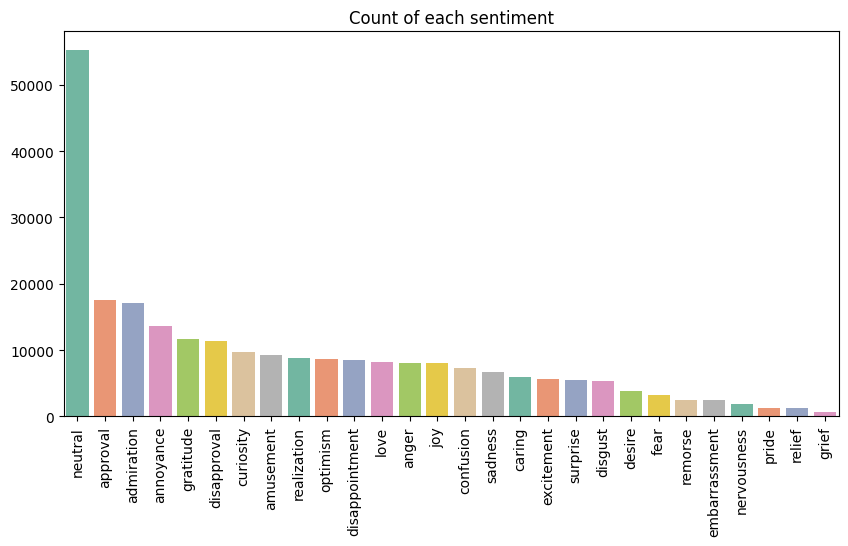

In [ ]:
def plot_sentiment_counts(data):
    """
    This function generates and displays a bar plot for the counts of each sentiment
    in the provided DataFrame. 'text' columns are ignored.
    """
    # Calculate the sum of each sentiment column and sort the results in descending order
    sentiment_counts = data.drop(columns=['text','clean_text']).sum().sort_values(ascending=False)

    # Set the figure size for better visualization
    plt.figure(figsize=(10,5))

    # Create a bar plot of sentiment counts
    sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette='Set2')

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=90)

    # Set the title of the plot
    plt.title('Count of each sentiment')

    # Display the plot
    plt.show()

# Call the function on the emotions_data DataFrame
plot_sentiment_counts(emotions_data)

## Count Sentiments Per Text

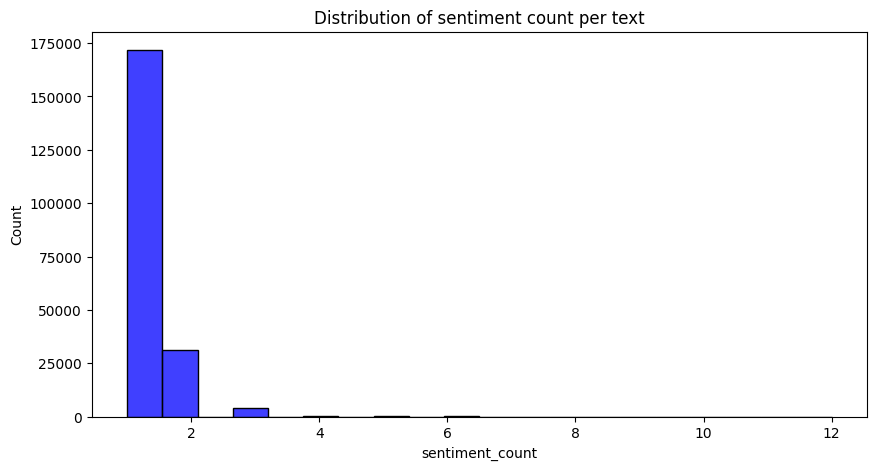

In [ ]:
def plot_sentiment_distribution(data):
    """
    This function calculates the sentiment count per text in the provided DataFrame,
    generates and displays a histogram for the distribution of these counts.
    The 'text' columns are ignored in the sentiment count.
    """
    # Calculate the sentiment count per text and add it as a new column to the DataFrame
    data['sentiment_count'] = data.drop(columns=['text','clean_text']).sum(axis=1)

    # Set the figure size for better visualization
    plt.figure(figsize=(10,5))

    # Create a histogram for the distribution of sentiment counts
    sns.histplot(data['sentiment_count'], bins=20, kde=False, color='blue')

    # Set the title of the plot
    plt.title('Distribution of sentiment count per text')

    # Display the plot
    plt.show()

# Call the function on the emotions_data DataFrame
plot_sentiment_distribution(emotions_data)

## Word Clouds For Each Sentiment

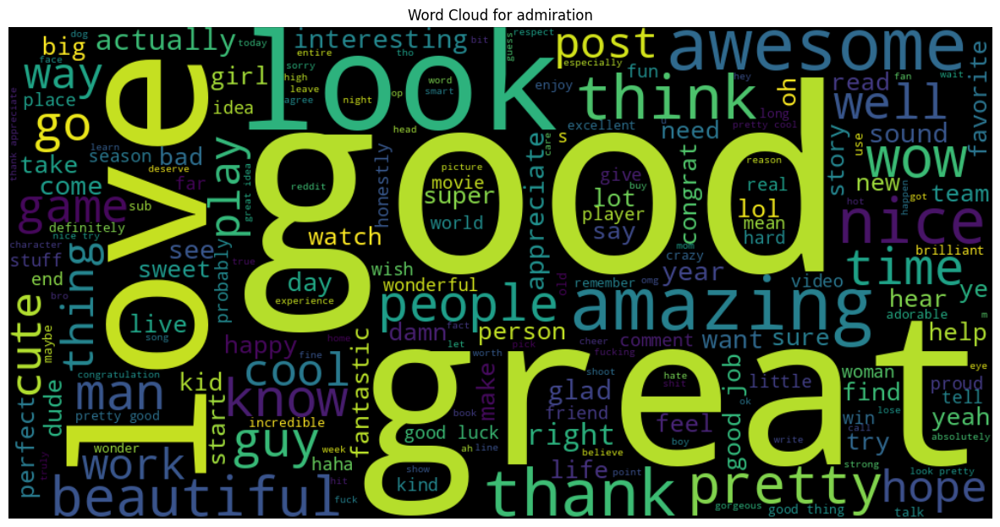

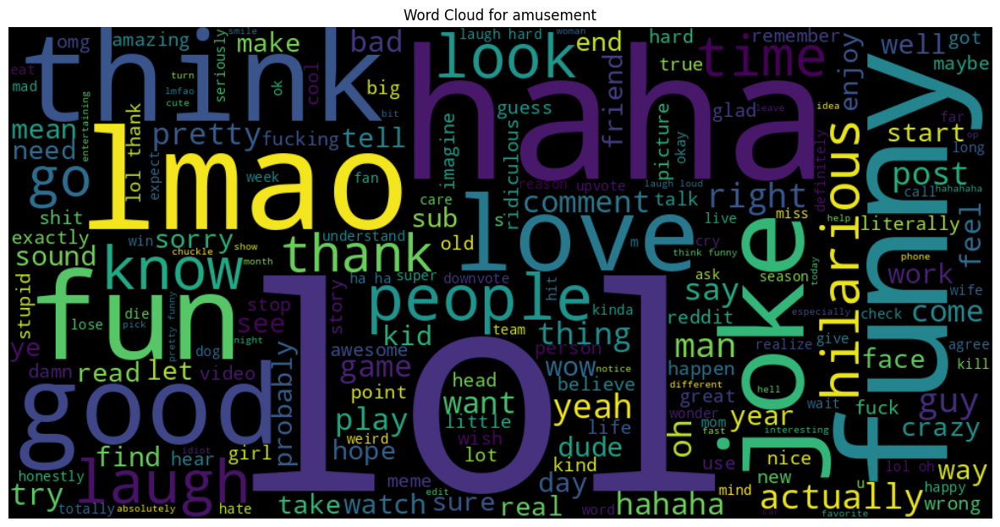

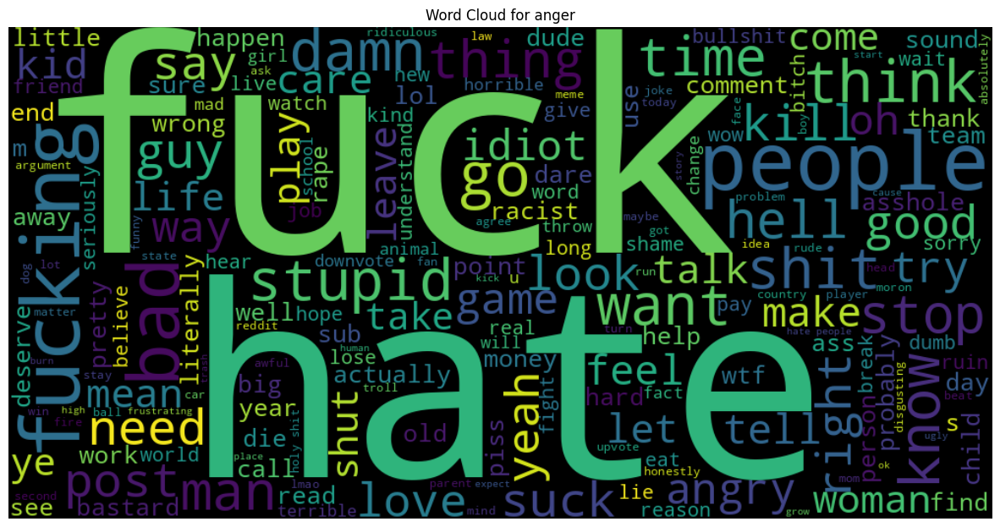

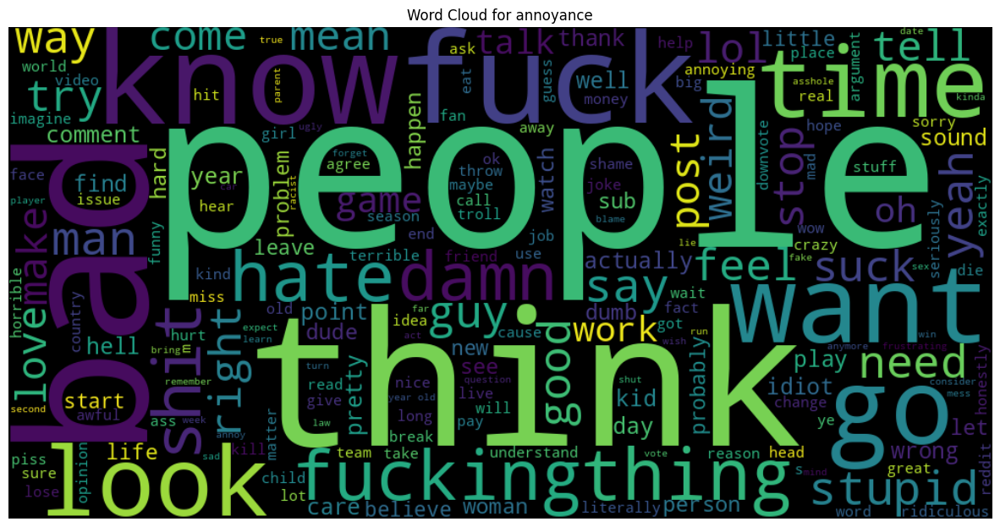

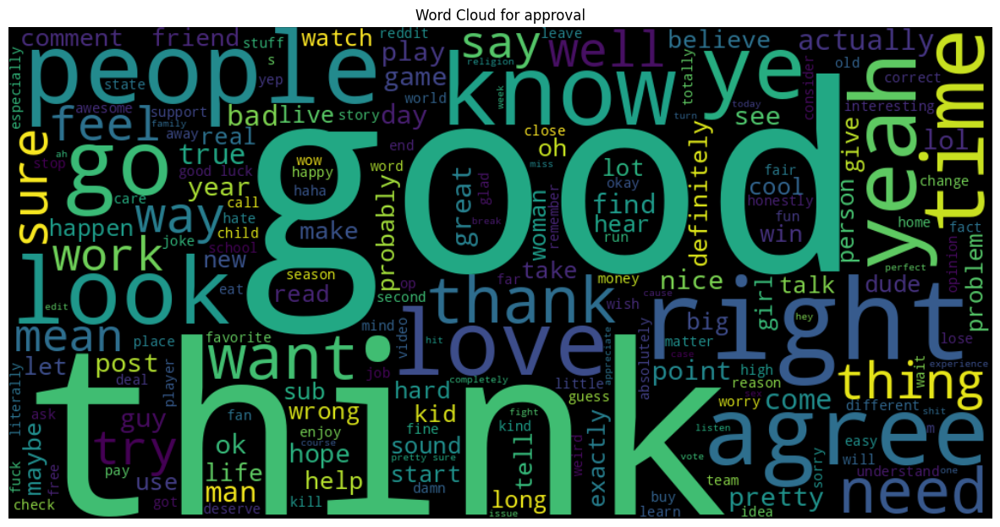

...

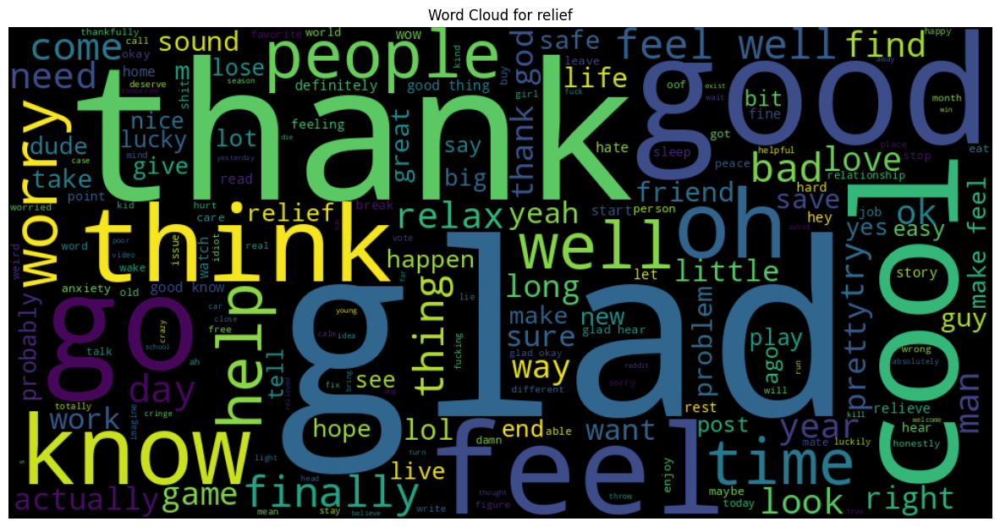

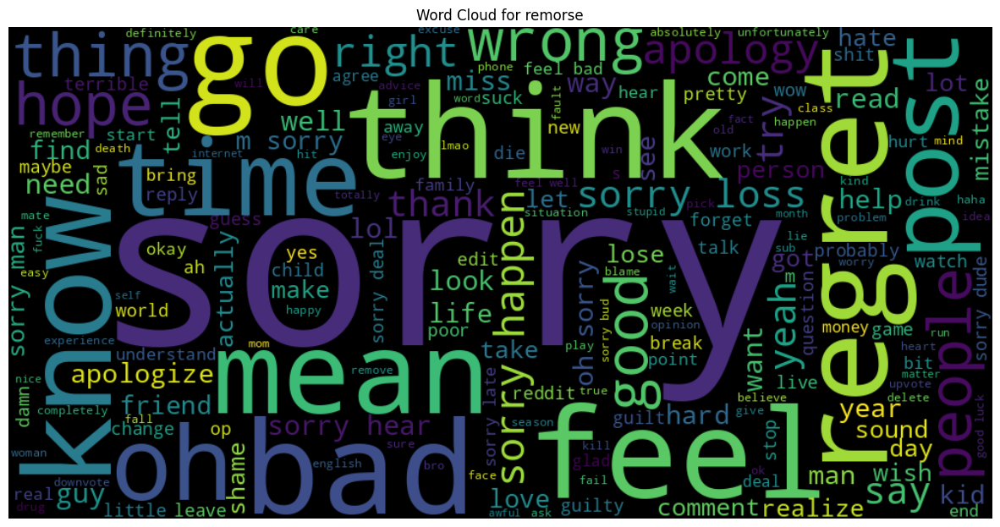

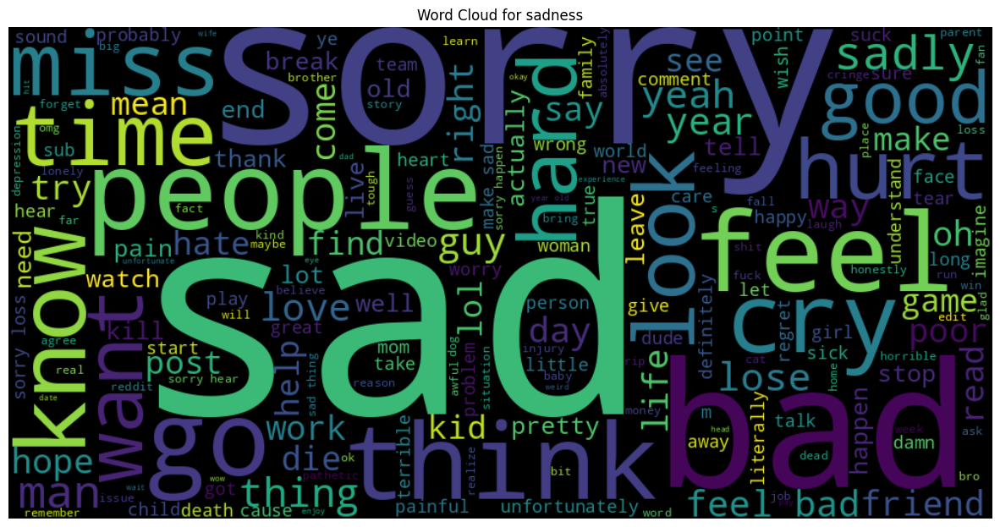

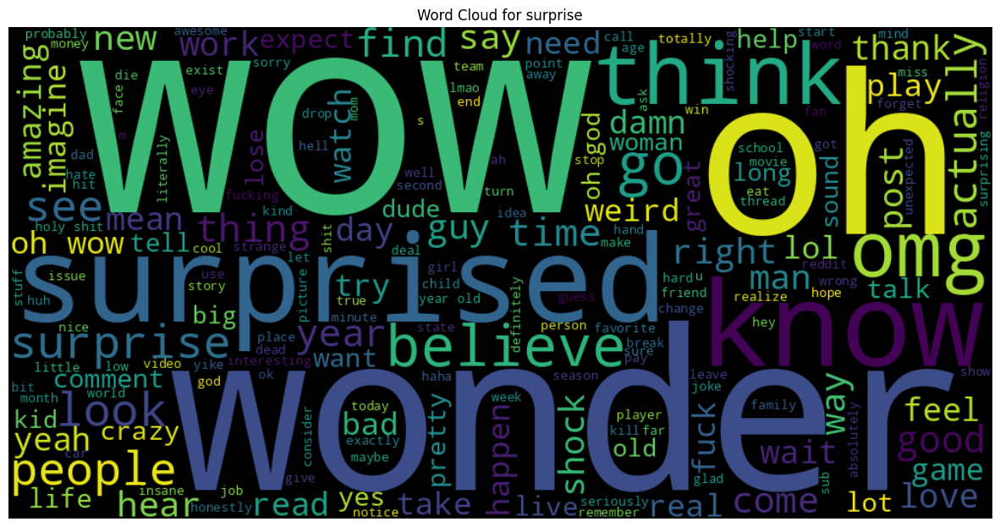

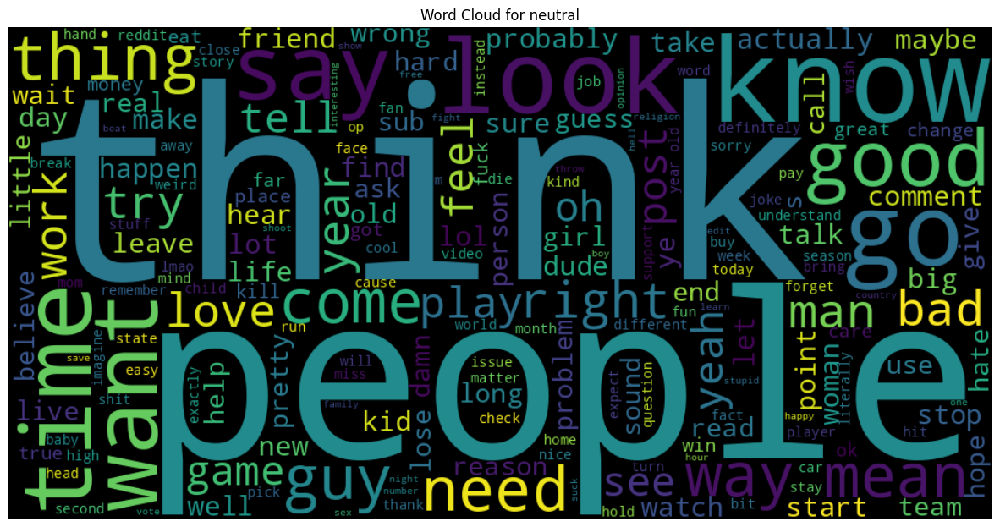

In [ ]:
def generate_wordclouds(data):
    """
    This function generates and displays a word cloud for each sentiment in the provided DataFrame.
    Only rows where the sentiment is present are considered for each word cloud.
    """
    # Iterate over each sentiment column in the DataFrame
    for sentiment in data.columns[1:-2]:
        # Get all words associated with the current sentiment
        words = ' '.join(data[data[sentiment] == 1]['clean_text'].values)

        # Generate a word cloud from the words
        wordcloud = WordCloud(width=1000, height=500).generate(words)

        # Create a new figure for the word cloud
        plt.figure(figsize=(15, 8))

        # Display the word cloud
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')  # Hide the axis

        # Set a title for the word cloud and display it
        plt.title(f'Word Cloud for {sentiment}')
        plt.show()

# Call the function on the emotions_data DataFrame
generate_wordclouds(emotions_data)

## Bigram Analysis

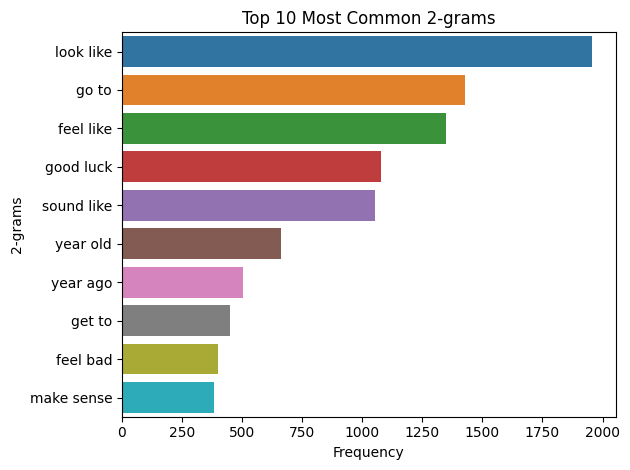

In [ ]:
def plot_top_ngrams_barchart(text, n=2, top=10):
    """
    This function generates and displays a bar chart for the top n-grams in the provided text data.

    Args:
    text: A list or Series of text data.
    n: The "n" in n-gram. Defaults to 2 (bigrams).
    top: The number of top n-grams to display in the bar chart. Defaults to 10.
    """
    # Use CountVectorizer to create n-grams
    vec = CountVectorizer(ngram_range=(n, n)).fit(text)

    # Transform the text data into a bag-of-words representation
    bag_of_words = vec.transform(text)

    # Get the count of each n-gram
    sum_words = bag_of_words.sum(axis=0)

    # Create a list of tuples where each tuple is a word and its frequency
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]

    # Sort the list by frequency
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)

    # Get the top 'top' n-grams
    top_n_bigrams = words_freq[:top]

    # Separate the n-grams and their counts into two lists
    x, y = map(list, zip(*top_n_bigrams))

    # Create a bar plot for the top n-grams
    sns.barplot(x=y, y=x)
    plt.xlabel("Frequency")
    plt.ylabel(f"{n}-grams")
    plt.title(f"Top {top} Most Common {n}-grams")
    plt.tight_layout()
    plt.show()

# Call the function on the 'text' column of the DataFrame
plot_top_ngrams_barchart(emotions_data['clean_text'], 2)

# Data Preparation

## Removing Unnecessary Columns

In [ ]:
# Specify columns to be dropped
columns_to_drop = ['sentiment_count', 'text']

# Drop the specified columns from the DataFrame
emotions_data.drop(columns_to_drop, axis=1, inplace=True)

print("Preview of the DataFrame after column removal:")
emotions_data.head()

Preview of the DataFrame after column removal:


,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,disappointment,...,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral,clean_text
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,bad end will spoil suck bad avenger movie
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,happy cake day u sneakpeekbot
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,reject methodology content study
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,thank agree
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,doubt dumbass


# Saving the Dataframe as a Pickle

In [ ]:
# Save the pdfs_df DataFrame as a pickle file so I don't have to rerun script and nuse up Google resources
emotions_data.to_pickle("emotions_data.pkl")
# Read the pickle back into the script
#pdfs_df = pd.read_pickle("pdfs_df.pkl")

## Data Preparation: Splitting and Structuring

To ensure the robust performance and accurate evaluation of our models, it's crucial to carefully split our dataset. We divide the `emotions_data` into three distinct sets:

- **Training Set (80%):** This set forms the backbone of our model's learning process. It constitutes the largest chunk, accounting for 80% of the entire dataset.

- **Validation Set (10%):** This set plays a pivotal role in hyperparameter tuning and model selection. It provides an unbiased perspective on a model's performance during the iterative training phases.

- **Test Set (10%):** This is a dedicated portion of the dataset that remains untouched during both the model's training and tuning phases. It's meant to give a conclusive evaluation, ensuring that our model performs well on previously unseen data.


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

def preprocess_data(emotions_data):
    """
    Preprocess the data: Convert emotion columns to integer and split the data.

    Args:
    - emotions_data (pd.DataFrame): The dataframe containing text and emotion columns.

    Returns:
    - train_df (pd.DataFrame): Training set.
    - val_df (pd.DataFrame): Validation set.
    - test_df (pd.DataFrame): Test set.
    - emotion_columns_list (list): List of emotion columns.
    """

    # Identify emotion columns that are numeric
    emotion_columns_list = emotions_data.select_dtypes(include=['number']).columns.tolist()

    # Convert emotion columns to integer type
    emotions_data[emotion_columns_list] = emotions_data[emotion_columns_list].astype(int)

    # Split the data into train, validation, and test sets
    train_df, test_df = train_test_split(emotions_data, test_size=0.2, random_state=42)
    val_df, test_df = train_test_split(test_df, test_size=0.5, random_state=42)

    return train_df, val_df, test_df, emotion_columns_list

train_df, val_df, test_df, emotion_columns_list = preprocess_data(emotions_data)

## Tokenizer and Model Initialization


### 1. Transformers
- **What**: A neural network architecture, specifically designed for handling sequential data such as text.
- **Why**: Its self-attention mechanism allows it to weigh the significance of tokens (like words) in relation to one another in a sequence, making it efficient at capturing context and perfect for various NLP tasks.
- **Example**: In the sentence "The cat, which was brown, jumped over the lazy dog.", transformers can understand the relationship between "cat" and "brown", even though they're separated by several words.

### 2. Tokenizer
- **What**: A tool or method to break down text into smaller units termed as tokens.
- **Why**: Neural networks require numerical input, whereas text is inherently non-numerical. Tokenizers translate text into a model-friendly format, such as integers or vectors. This conversion is pivotal for preprocessing text data.
- **Example**: Given a statement like "I feel ecstatic today!", a tokenizer might break it down into tokens like `[I, feel, ecstatic, today, !]`, which can then be mapped to unique IDs such as `[105, 106, 107, 108, 109]`.

### 3. BERT Model
- **What**: A specific type of transformer, pre-trained on substantial datasets.
- **Why**: Initiating model training from scratch demands a vast amount of data and computational prowess. BERT provides a base, capturing generic language patterns. Users can subsequently fine-tune BERT for particular tasks or datasets, conserving both time and computational resources.
- **Example**: If the goal is to build a model for emotional classification in textual data, starting from scratch isn't the only option. BERT, having already grasped intricate language patterns from its extensive pre-training, can be efficiently fine-tuned on a smaller dataset specific to emotional contexts, ensuring more accurate classification outcomes.

In [ ]:
def initialize_tokenizer_and_model():
    """
    Initialize the BERT tokenizer and model.

    Returns:
    - tokenizer: BERT tokenizer.
    - bert_model: BERT model.
    """

    # Load BERT tokenizer and model
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    bert_model = TFBertModel.from_pretrained('bert-base-uncased')

    return tokenizer, bert_model

tokenizer, bert_model = initialize_tokenizer_and_model()


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

## Data Tokenization


### Special Tokens
- **CLS**: Classifier Token. Used as the representation of the entire input sequence in tasks like classification.
- **SEP**: Separator Token. Demarcates the end of one sequence and the start of another in tasks with two sequences.

In [ ]:
def tokenize_data(df, tokenizer):
    """
    Tokenize the text data using BERT tokenizer.

    Args:
    - df (pd.DataFrame): Dataframe containing the text data.
    - tokenizer: BERT tokenizer.

    Returns:
    - Dictionary containing tokenized input ids and attention masks.
    """

    input_ids = []
    attention_masks = []

    # Tokenizing the 'clean_text' column from the provided dataframe
    for text in df['clean_text']:
        # Using the BERT tokenizer's encode_plus method to convert text to tokens
        tokens = tokenizer.encode_plus(
            text,                                  # Current text entry
            add_special_tokens=True,               # Add special tokens like '[CLS]' and '[SEP]'
            max_length=128,                        # Max length for tokens; truncate or pad as needed
            padding='max_length',                  # Pad tokens to the max_length
            return_tensors='tf'                    # Return token outputs as TensorFlow tensors
        )

        # Extract and store input_ids for each tokenized text entry
        input_ids.append(tokens['input_ids'][0])

        # Extract and store attention masks for each tokenized text entry
        attention_masks.append(tokens['attention_mask'][0])

    # Returning the tokenized information as structured data
    return {'input_ids': np.array(input_ids), 'attention_mask': np.array(attention_masks)}


train_tokens = tokenize_data(train_df, tokenizer)
val_tokens = tokenize_data(val_df, tokenizer)
test_tokens = tokenize_data(test_df, tokenizer)

## Dataset Creation

In [ ]:
def create_tf_dataset(tokens, df, emotion_columns_list):
    """
    Create a TensorFlow dataset from tokenized data.

    Args:
    - tokens (dict): Dictionary containing:
      * input_ids: A sequence of integers representing words in the text.
      * attention_masks: A sequence of integers (either 0 or 1) indicating which tokens in the input_ids
                         should be attended to (1) and which should be ignored (0).
    - df (pd.DataFrame): Dataframe containing emotion labels.
    - emotion_columns_list (list): List of emotion columns.

    Returns:
    - TensorFlow dataset: Dataset pairing tokenized text and its corresponding emotion labels.
    """

    return tf.data.Dataset.from_tensor_slices((tokens, df[emotion_columns_list].values))

train_dataset = create_tf_dataset(train_tokens, train_df, emotion_columns_list)
val_dataset = create_tf_dataset(val_tokens, val_df, emotion_columns_list)
test_dataset = create_tf_dataset(test_tokens, test_df, emotion_columns_list)

# Model: Building, Training, and Evaluation

## Model Building

In [ ]:
def build_model(bert_model, emotion_columns_list):
    """
    Build the emotion classification model using BERT.

    Args:
    - bert_model: Pre-trained BERT model.
    - emotion_columns_list (list): List of emotion columns.

    Returns:
    - emotion classification model.
    """

    input_ids = tf.keras.layers.Input(shape=(128,), dtype=tf.int32, name='input_ids')
    attention_mask = tf.keras.layers.Input(shape=(128,), dtype=tf.int32, name='attention_mask')

    # Obtain BERT embeddings and take the [CLS] token representation
    bert_output = bert_model(input_ids, attention_mask=attention_mask)[0]
    clf_output = bert_output[:, 0, :]

    # Final dense layer for emotion classification
    output = tf.keras.layers.Dense(len(emotion_columns_list), activation='sigmoid')(clf_output)

    return tf.keras.Model(inputs=[input_ids, attention_mask], outputs=output)

model = build_model(bert_model, emotion_columns_list)

## Model Compilation and Training

In [ ]:
learning_rate = 5e-5
epochs = 4
batch_size = 16

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy'])

history = model.fit(train_dataset.shuffle(1000).batch(batch_size),
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=val_dataset.batch(batch_size))

Epoch 1/4


10391/10391 [==============================] - 4452s 424ms/step - loss: 0.1271 - accuracy: 0.3927 - val_loss: 0.1226 - val_accuracy: 0.4034
Epoch 2/4
10391/10391 [==============================] - 4394s 423ms/step - loss: 0.1178 - accuracy: 0.4193 - val_loss: 0.1221 - val_accuracy: 0.4009
Epoch 3/4
10391/10391 [==============================] - 4397s 423ms/step - loss: 0.1093 - accuracy: 0.4493 - val_loss: 0.1264 - val_accuracy: 0.3777
Epoch 4/4
10391/10391 [==============================] - 4390s 423ms/step - loss: 0.1009 - accuracy: 0.4807 - val_loss: 0.1327 - val_accuracy: 0.3630


## Evaluation

In [ ]:
def evaluate_and_report(model, test_dataset, test_df, emotion_columns_list, batch_size):
    """
    Evaluate the model and produce a classification report.

    Args:
    - model (tf.keras.Model): The trained TensorFlow/Keras model to evaluate.
    - test_dataset (tf.data.Dataset): The test dataset formatted for the model.
    - test_df (pd.DataFrame): DataFrame containing the true labels for the test set.
    - emotion_columns_list (list): List of emotion columns to consider in the classification report.
    - batch_size (int): Number of samples per gradient update during evaluation.

    Returns:
    - str: Classification report as a string.
    """

    # Evaluate the model on the test dataset
    results = model.evaluate(test_dataset.batch(batch_size))
    print("Test loss, Test accuracy:", results)

    # Get the model's predictions on the test dataset
    predictions = model.predict(test_dataset.batch(batch_size))
    predictions = (predictions > 0.5).astype(int)

    # Generate and print the classification report
    report = classification_report(test_df[emotion_columns_list].values, predictions, target_names=emotion_columns_list)

    return report

print(evaluate_and_report(model, test_dataset, test_df, emotion_columns_list, batch_size))

1299/1299 [==============================] - 190s 146ms/step - loss: 0.1338 - accuracy: 0.3659
Test loss, Test accuracy: [0.13377098739147186, 0.36589357256889343]
1299/1299 [==============================] - 190s 144ms/step
                precision    recall  f1-score   support

    admiration       0.56      0.50      0.53      1710
     amusement       0.57      0.63      0.60       960
         anger       0.43      0.23      0.30       827
     annoyance       0.24      0.22      0.23      1371
      approval       0.39      0.09      0.15      1735
        caring       0.35      0.12      0.18       610
     confusion       0.41      0.14      0.21       721
     curiosity       0.35      0.26      0.29       996
        desire       0.42      0.14      0.21       392
disappointment       0.29      0.06      0.10       865
   disapproval       0.29      0.05      0.08      1188
       disgust       0.41      0.16      0.23       529
 embarrassment       0.42      0.17      0.24 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Predicting Emotions for a Given Text

In [ ]:
def predict_emotions_for_text(text, tokenizer, model, emotion_columns_list):
    """
    Predict the emotions for a given text using the trained model.

    Args:
    - text (list of str): List containing a single text for which to predict emotions.
    - tokenizer: Tokenizer used for encoding the text.
    - model (tf.keras.Model): The trained TensorFlow/Keras model for emotion prediction.
    - emotion_columns_list (list): List of emotion columns corresponding to the model's output.

    Returns:
    - list of tuple: List of tuples where each tuple has the emotion and its corresponding probability, sorted in descending order of probability.
    """

    # Tokenize the text
    tokens = tokenizer.encode_plus(
        text[0],
        add_special_tokens=True,
        max_length=128,
        padding='max_length',
        return_tensors='tf'
    )

    # Convert the tokenized text to TensorFlow format
    input_ids = tokens['input_ids']
    attention_mask = tokens['attention_mask']

    # Use the trained model to predict the emotion
    predicted_emotions = model.predict({'input_ids': input_ids, 'attention_mask': attention_mask})

    # Pair each emotion label with its probability
    emotion_probabilities = {}
    for i, emotion in enumerate(emotion_columns_list):
        emotion_probabilities[emotion] = predicted_emotions[0][i]

    # Sort the pairs based on the probability
    sorted_emotions = sorted(emotion_probabilities.items(), key=lambda x: x[1], reverse=True)

    return sorted_emotions

In [ ]:
# Usage example:
text = ["We have a love-hate relationship"]
sorted_emotions = predict_emotions_for_text(text, tokenizer, model, emotion_columns_list)
for emotion, probability in sorted_emotions:
    print(f"{emotion}: {probability*100:.2f}%")

1/1 [==============================] - 3s 3s/step
anger: 44.53%
annoyance: 23.36%
disgust: 18.72%
love: 17.36%
sadness: 11.63%
disapproval: 9.98%
disappointment: 5.71%
neutral: 5.24%
approval: 3.63%
realization: 3.41%
curiosity: 2.82%
excitement: 2.10%
embarrassment: 1.24%
confusion: 1.17%
admiration: 1.16%
joy: 1.14%
desire: 1.02%
optimism: 1.00%
caring: 0.95%
amusement: 0.90%
nervousness: 0.78%
remorse: 0.77%
grief: 0.60%
gratitude: 0.35%
fear: 0.33%
surprise: 0.18%
relief: 0.07%
pride: 0.06%


In [ ]:
# Tokenize the text
text = ["I love you"]
tokens = tokenizer.encode_plus(
    text[0],
    add_special_tokens=True,
    max_length=128,
    padding='max_length',
    return_tensors='tf'
)

# Convert the tokenized text to TensorFlow format
input_ids = tokens['input_ids']
attention_mask = tokens['attention_mask']

# Use the trained model to predict the emotion
predicted_emotions = model.predict({'input_ids': input_ids, 'attention_mask': attention_mask})

# Pair each emotion label with its probability
emotion_probabilities = {}
for i, emotion in enumerate(emotion_columns_list):
    emotion_probabilities[emotion] = predicted_emotions[0][i]

# Sort the pairs based on the probability
sorted_emotions = sorted(emotion_probabilities.items(), key=lambda x: x[1], reverse=True)

for emotion, probability in sorted_emotions:
    print(f"{emotion}: {probability*100:.2f}%")

1/1 [==============================] - 0s 53ms/step
love: 83.11%
neutral: 12.18%
sadness: 8.91%
admiration: 4.46%
gratitude: 3.23%
caring: 2.55%
joy: 1.58%
remorse: 1.57%
annoyance: 1.52%
desire: 1.46%
optimism: 1.24%
curiosity: 1.20%
excitement: 1.12%
realization: 1.06%
disappointment: 0.98%
approval: 0.80%
confusion: 0.77%
disapproval: 0.69%
amusement: 0.63%
anger: 0.63%
grief: 0.57%
nervousness: 0.11%
surprise: 0.10%
embarrassment: 0.08%
disgust: 0.08%
fear: 0.07%
pride: 0.06%
relief: 0.04%


# Saving the Trained Model

In [ ]:
# Save the entire model
model.save('emotion_classification_model.h5')

# Save just the model weights
model.save_weights('emotion_classification_weights.h5')

In [6]:
from keras.models import load_model
from transformers import TFBertModel

custom_objects = {'TFBertModel': TFBertModel}

keras_model = load_model('emotion_classification_model.h5', custom_objects=custom_objects)


In [7]:
model_architecture = keras_model.to_json()  # Convert model architecture to JSON
model_weights = keras_model.get_weights()    # Get model weights
optimizer_state = keras_model.optimizer.get_config()  # Get optimizer configuration

In [8]:
import joblib

joblib.dump(model_architecture, 'model_architecture.joblib')
joblib.dump(model_weights, 'model_weights.joblib')
joblib.dump(optimizer_state, 'optimizer_state.joblib')

['optimizer_state.joblib']